In [1]:
import sys, os, pickle, glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/')
from spk_lfp_cluster_comp_analysis import *
from config import SPE1_PICKLE_ROOT, PRIORITY_CELLS, CELL_IDS

warnings.filterwarnings("ignore")

In [2]:
# ── Paths ─────────────────────────────────────────────────────────────────────
SLIDING_DIR  = os.path.join(SPE1_PICKLE_ROOT, "lfp_spk_group_pickles")
PREPOST_DIR  = os.path.join(SPE1_PICKLE_ROOT, "prepost_specparam_pickles")
CLUSTER_DIR  = os.path.join(SPE1_PICKLE_ROOT, "cluster_pickles")

# ── Cell subsets ───────────────────────────────────────────────────────────────
subsets = get_cell_subsets(PRIORITY_CELLS, CELL_IDS)
# subsets["priority"] — priority cells only
# subsets["np"]       — non-priority cells
# subsets["all"]      — all cells combined
print(f"Priority: {len(subsets['priority'])} cells")
print(f"NP:       {len(subsets['np'])} cells")
print(f"All:      {len(subsets['all'])} cells")
# Spike feature colour palette (consistent across all notebooks)
feature_shades = {
    'peak_amp_cluster':         '#8c564b',
    'peak_sharpness_cluster':   '#a06d62',
    'peak_width_cluster':       '#b38479',
    'exp_lambda_cluster':       '#c561a8',
    'inflection_time_cluster':  '#9b59b6',
    'exp_const_cluster':        '#d7aee0',
    'log_isi_cluster':          '#7f7f7f',
    'spk_times_ms_cluster':     '#b0b0b0',
}


Priority: 7 cells
NP:       36 cells
All:      43 cells


## 1. Load Data

In [3]:
df_pop_stats, pop_traces = compile_lfp_stats(SLIDING_DIR)
print(f'Loaded {df_pop_stats["cell_id"].nunique()} cells, {len(df_pop_stats)} comparisons')

Loaded 36 cells, 2519 comparisons


In [4]:
SUBSET_LABELS = [
    ("Priority cells",      subsets["priority"]),
    ("Non-priority cells",  subsets["np"]),
    ("All cells combined",  subsets["all"]),
]

## 2. Effect Sizes Across the Population

Distribution of Cohen's d for each LFP × spike feature pair. Significant windows only (p_fdr < 0.05).


Priority cells
=== SIGNIFICANT HITS SUMMARY ===


,lfp_feature,spike_feature,sig_windows_count,median_cohens_d
0,LFP Mean Amplitude,peak_amp_cluster,10,0.490469
1,LFP Std,peak_amp_cluster,7,0.339280
2,Aperiodic Offset,peak_amp_cluster,11,0.269980
3,Aperiodic Offset,peak_width_cluster,8,0.252730
4,LFP Std,log_isi_cluster,23,0.192628
...,...,...,...,...
57,r-squared,spk_times_ms_cluster,15,0.070726
58,LFP Spectral Exponent,spk_times_idx_cluster,19,0.070175
59,r-squared,inflection_amp_cluster,2,0.067220
60,Theta AUC,inflection_time_cluster,1,0.063581


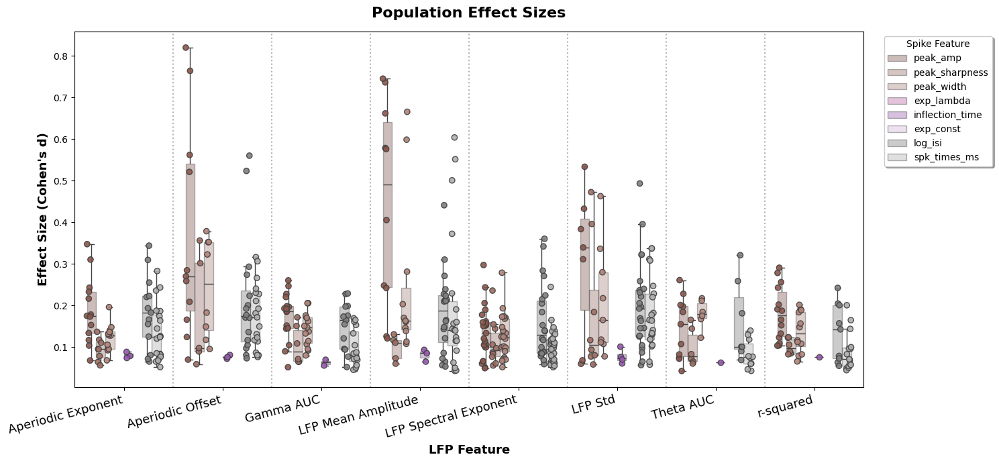


Non-priority cells
=== SIGNIFICANT HITS SUMMARY ===


,lfp_feature,spike_feature,sig_windows_count,median_cohens_d
0,LFP Mean Amplitude,log_isi_cluster,65,0.334677
1,Aperiodic Offset,log_isi_cluster,79,0.270878
2,LFP Std,log_isi_cluster,82,0.225223
3,Aperiodic Exponent,log_isi_cluster,82,0.219880
4,r-squared,log_isi_cluster,87,0.217279
...,...,...,...,...
71,Aperiodic Exponent,inflection_amp_cluster,1,0.071881
72,Gamma AUC,inflection_time_cluster,7,0.069285
73,LFP Spectral Exponent,inflection_time_cluster,20,0.068693
74,Aperiodic Offset,inflection_amp_cluster,1,0.067144


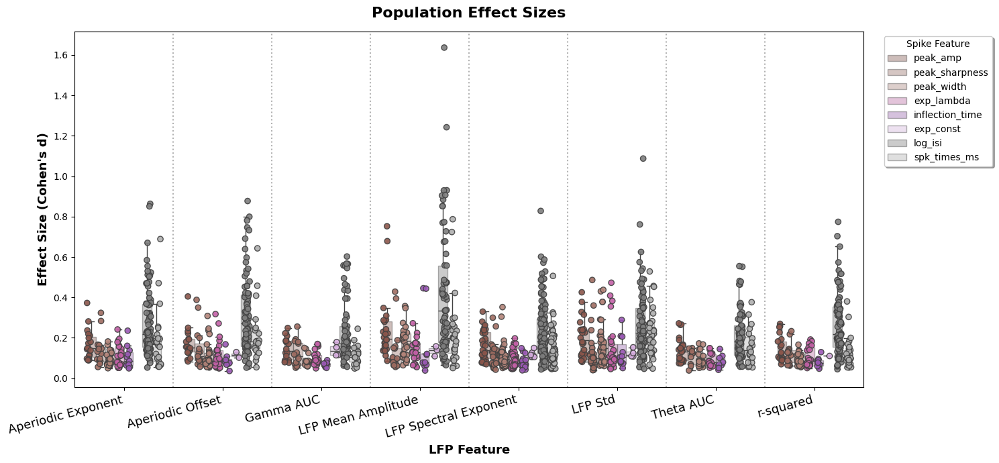


All cells combined
=== SIGNIFICANT HITS SUMMARY ===


,lfp_feature,spike_feature,sig_windows_count,median_cohens_d
0,LFP Mean Amplitude,log_isi_cluster,85,0.251031
1,Aperiodic Offset,log_isi_cluster,95,0.243120
2,LFP Mean Amplitude,peak_amp_cluster,34,0.226017
3,LFP Std,peak_amp_cluster,31,0.224774
4,LFP Std,log_isi_cluster,105,0.214020
...,...,...,...,...
73,LFP Mean Amplitude,inflection_amp_cluster,4,0.069973
74,Gamma AUC,inflection_time_cluster,9,0.069285
75,LFP Spectral Exponent,inflection_time_cluster,20,0.068693
76,Theta AUC,inflection_time_cluster,9,0.068064


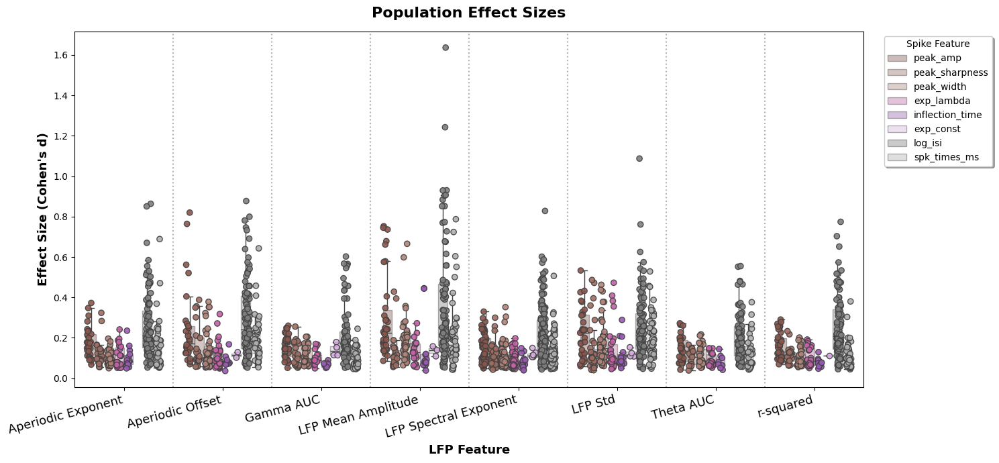

In [5]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    plot_population_effect_sizes(df_sub, feature_shades)

## 3. Temporal Significance Patterns

When relative to the spike do LFP differences occur?


Priority cells


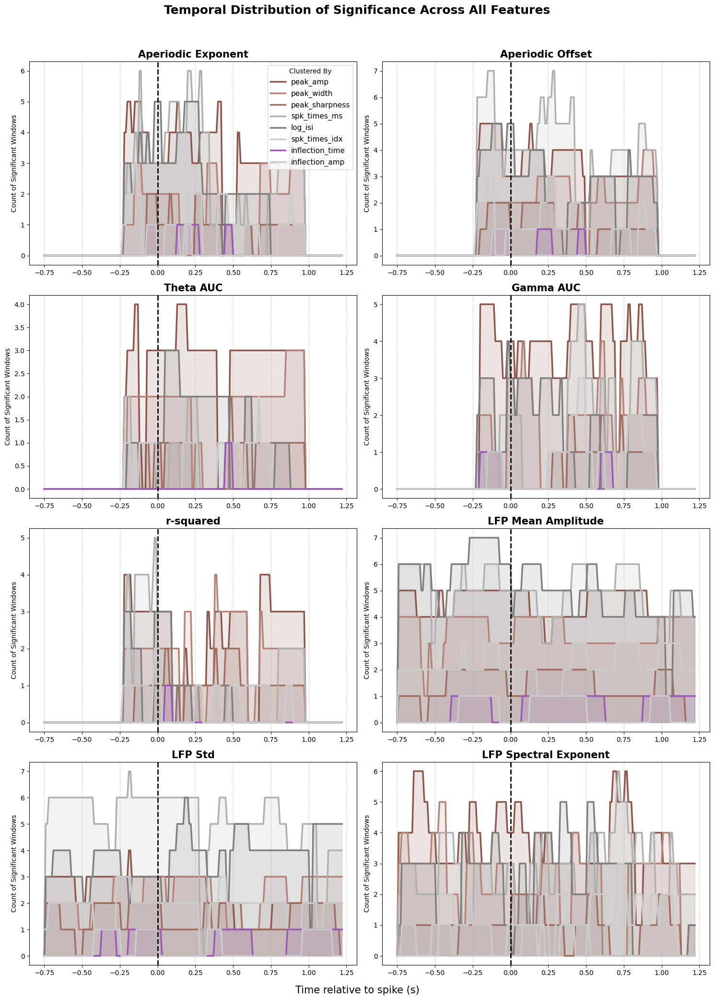


Non-priority cells


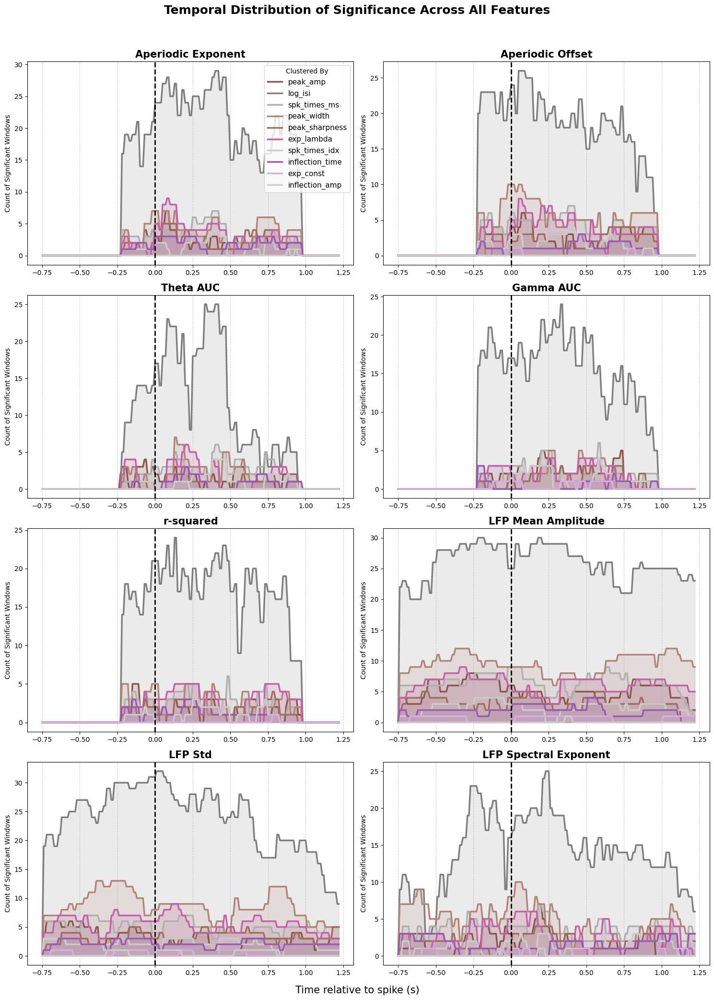


All cells combined


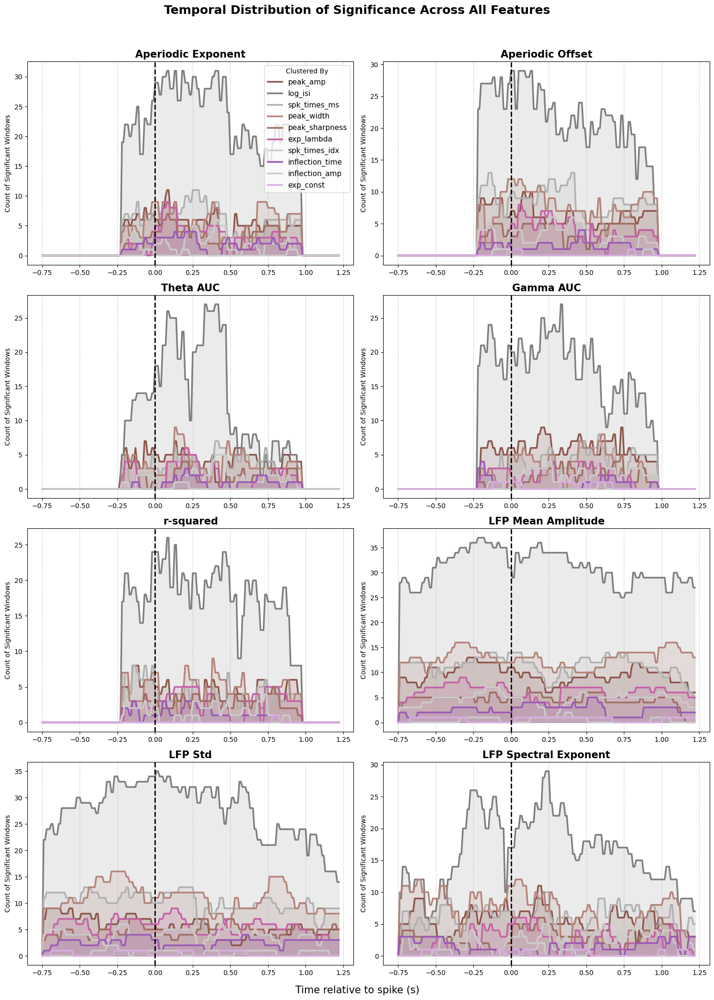

In [6]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    plot_temporal_significance_density(df_sub, feature_shades)

## 4. Grand Average Traces

Population-level mean LFP trace per cluster group.


Priority cells


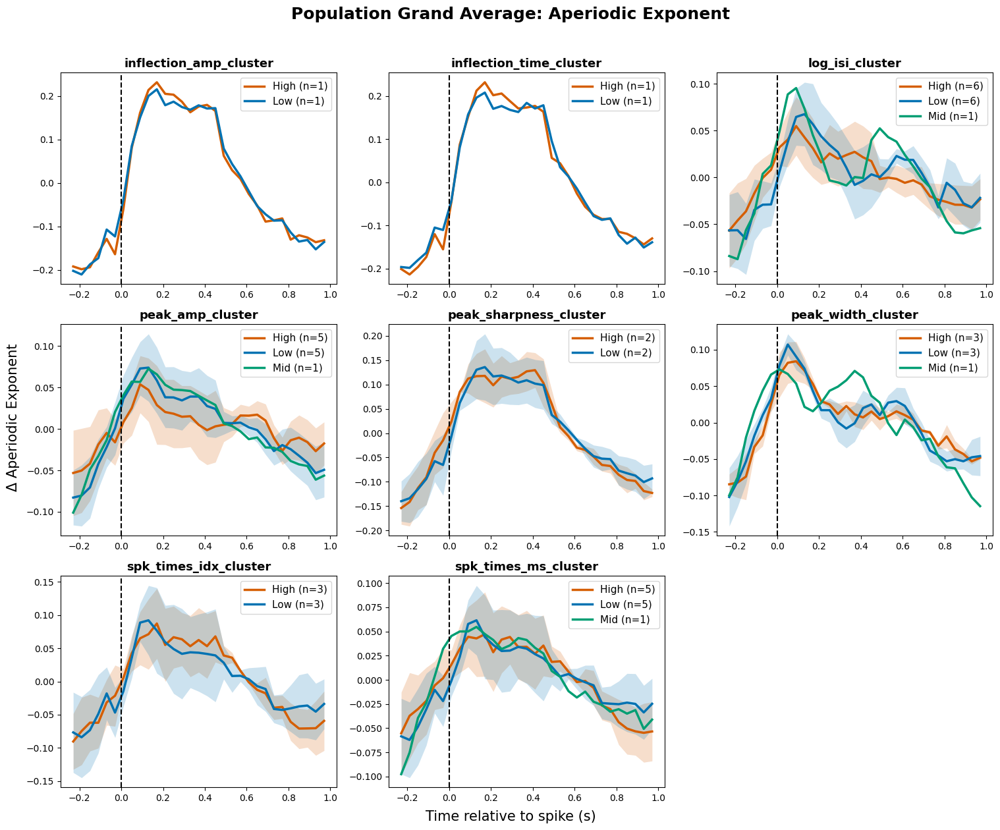

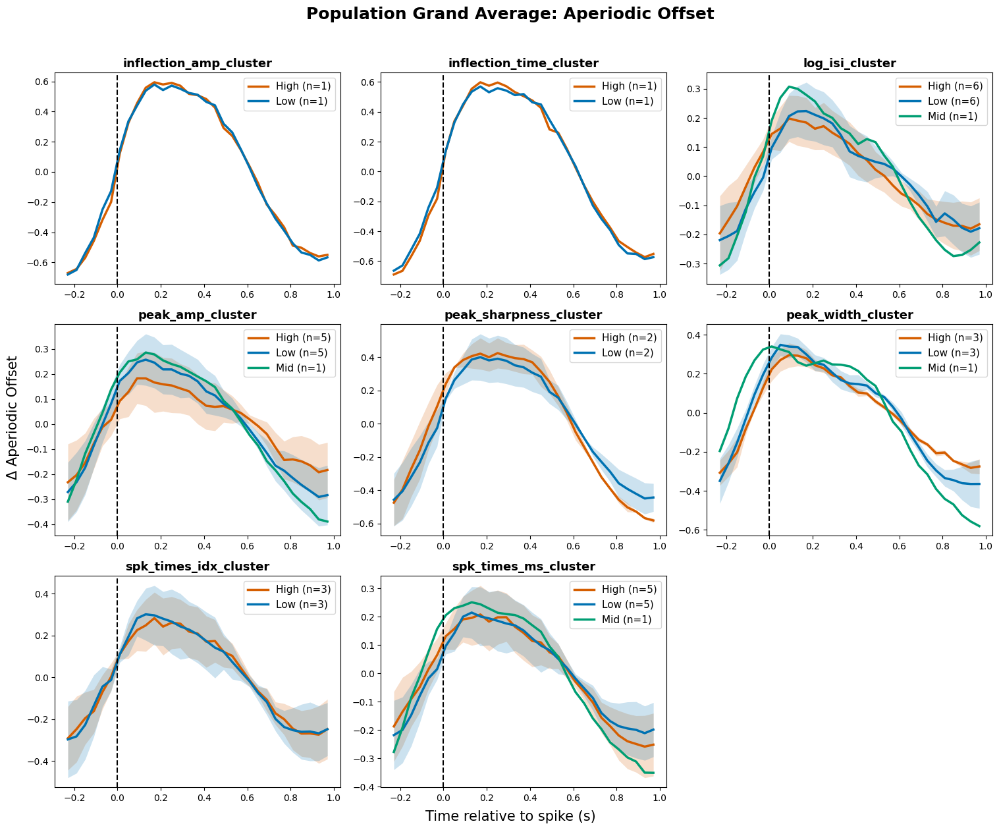

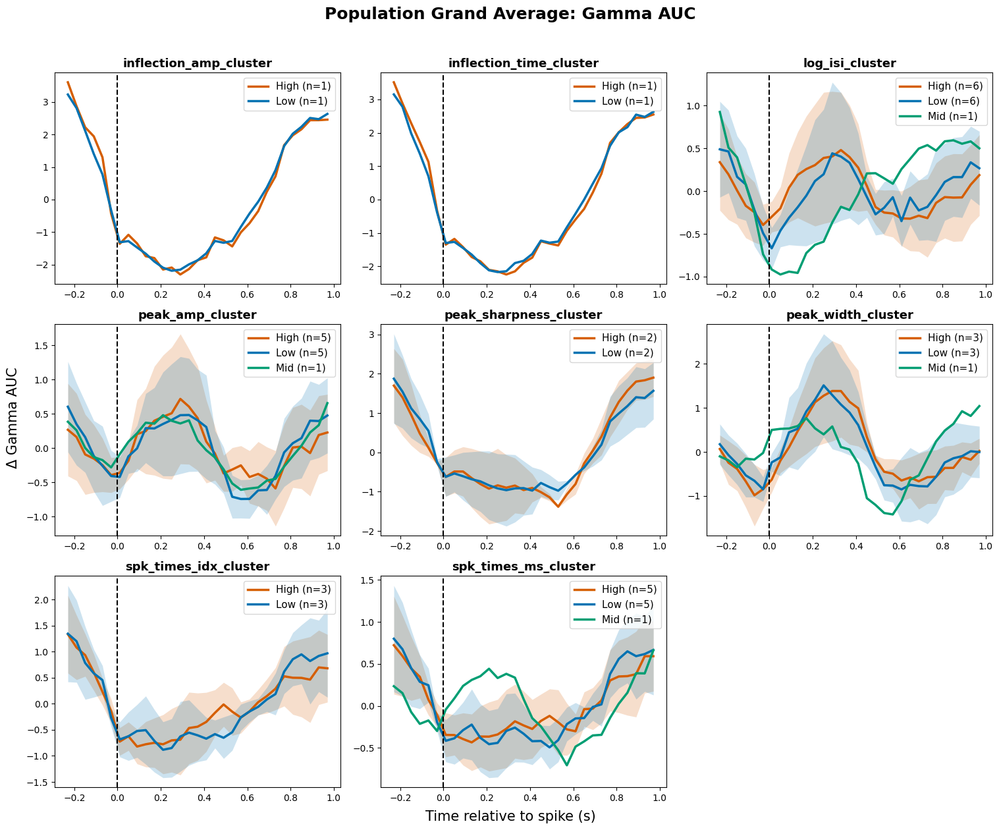

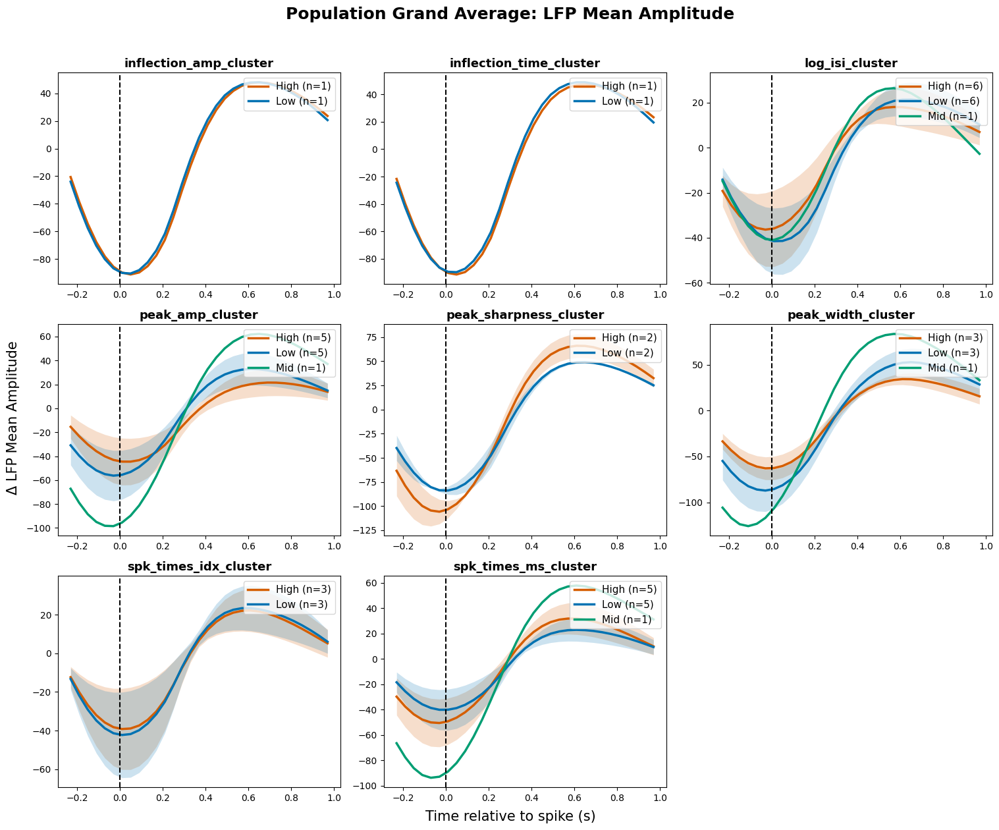

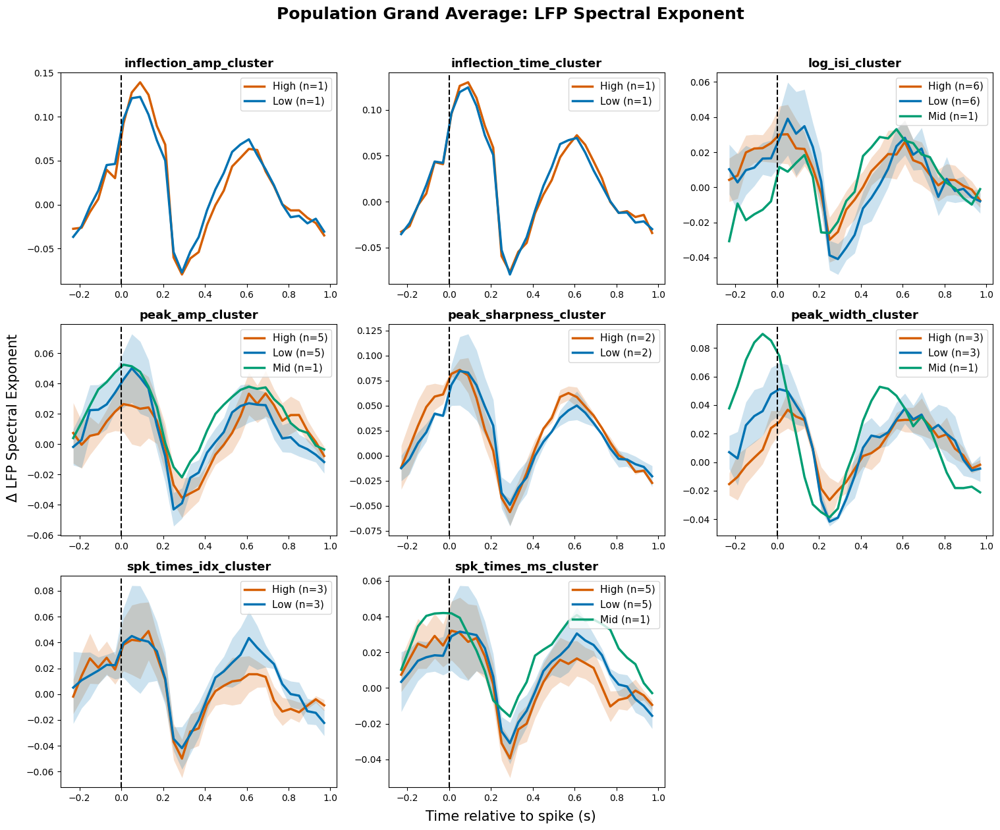

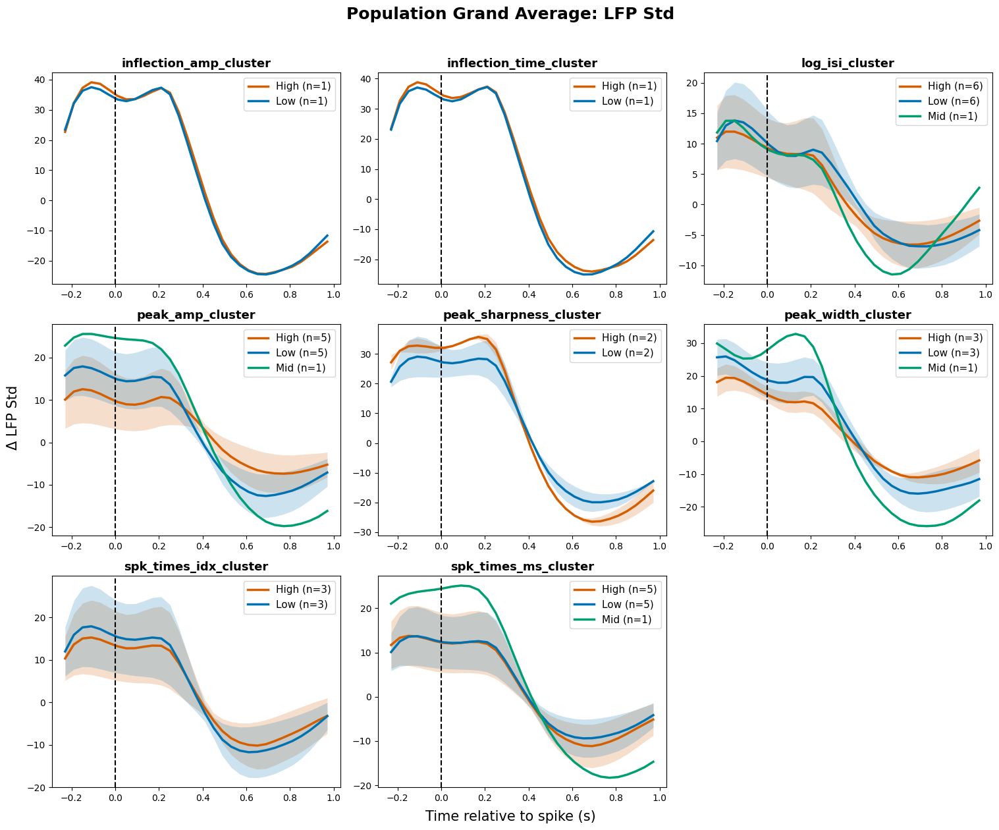

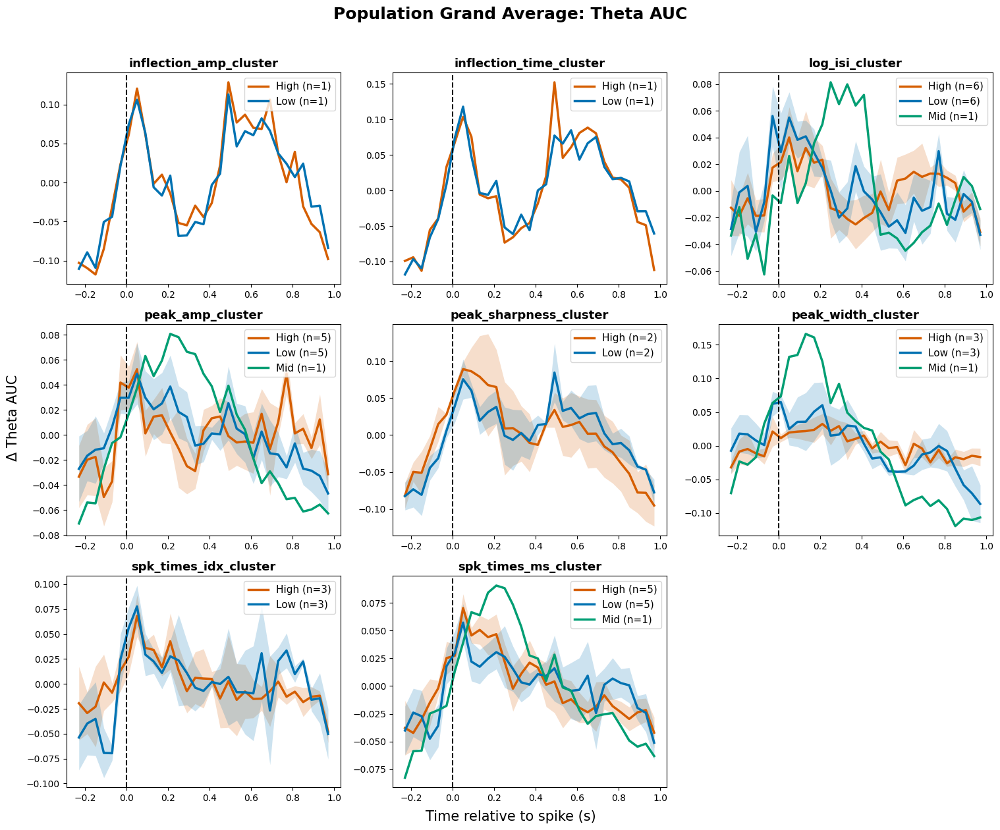

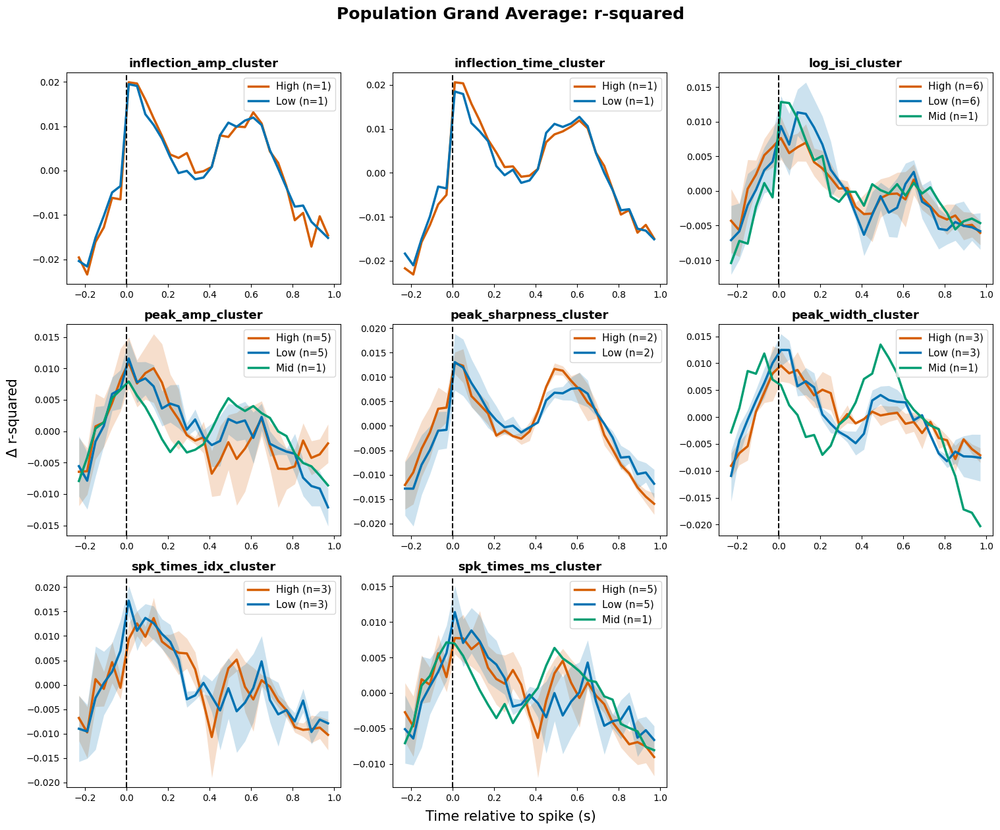


Non-priority cells


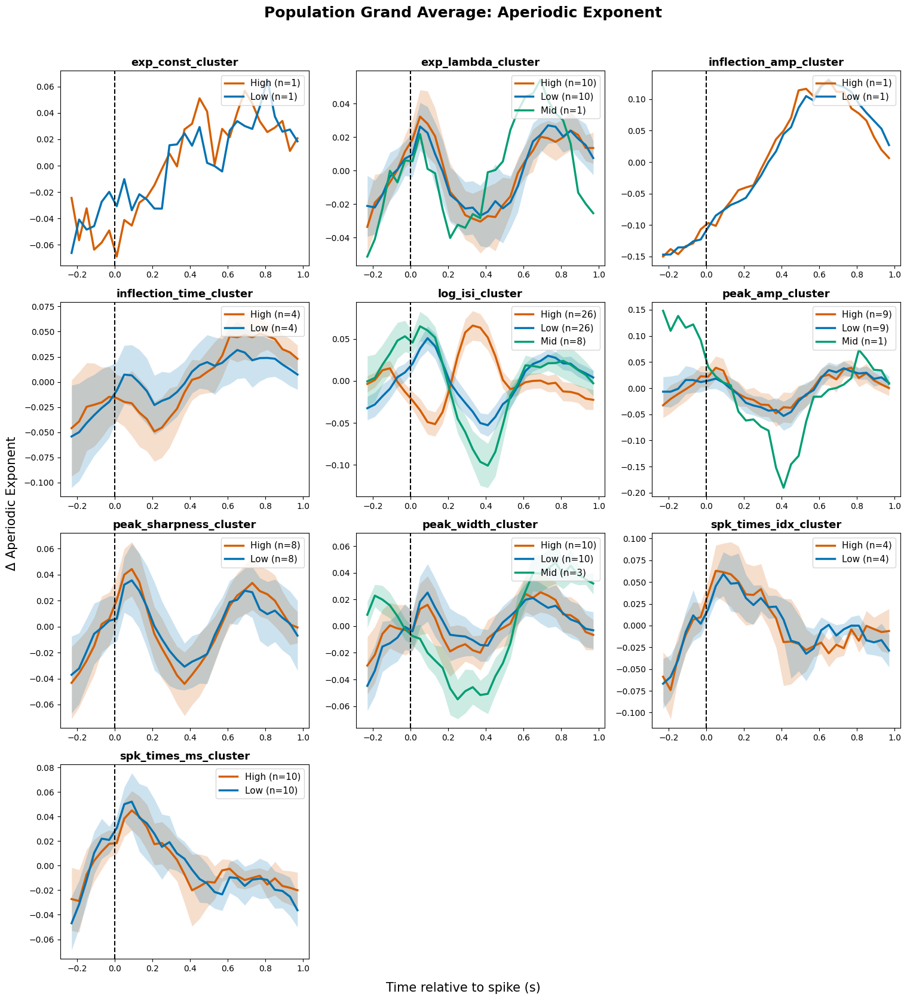

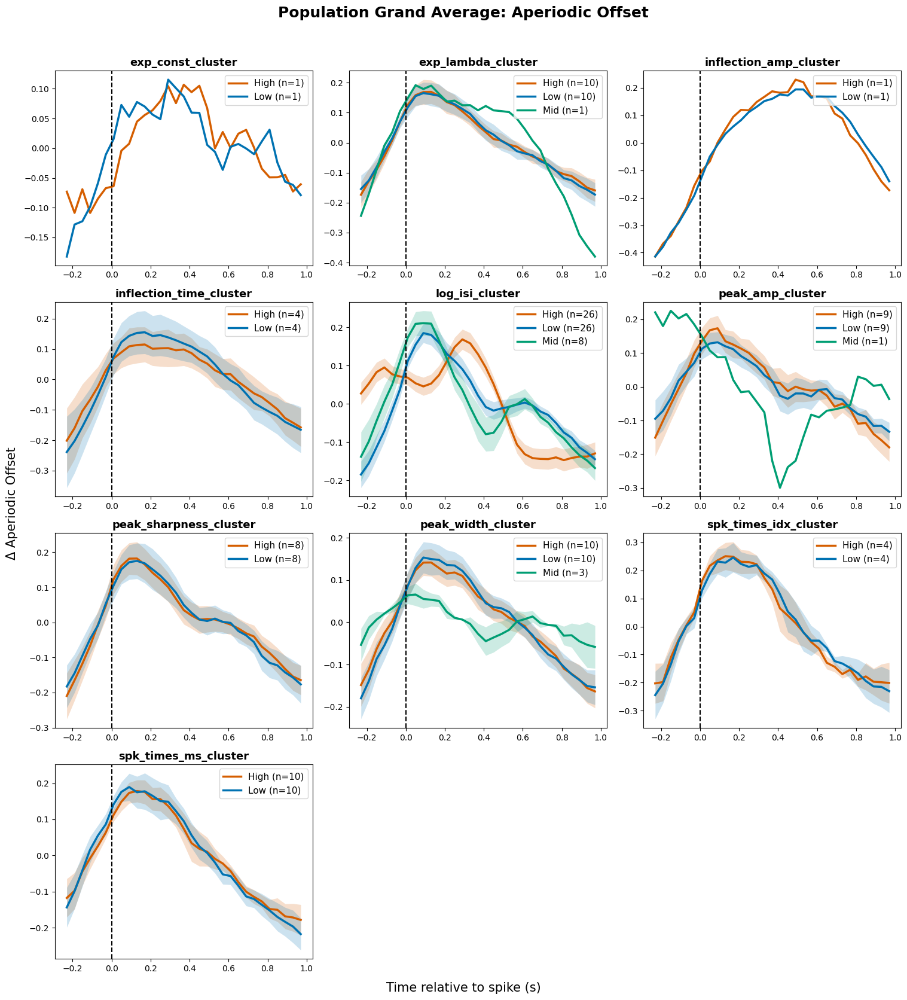

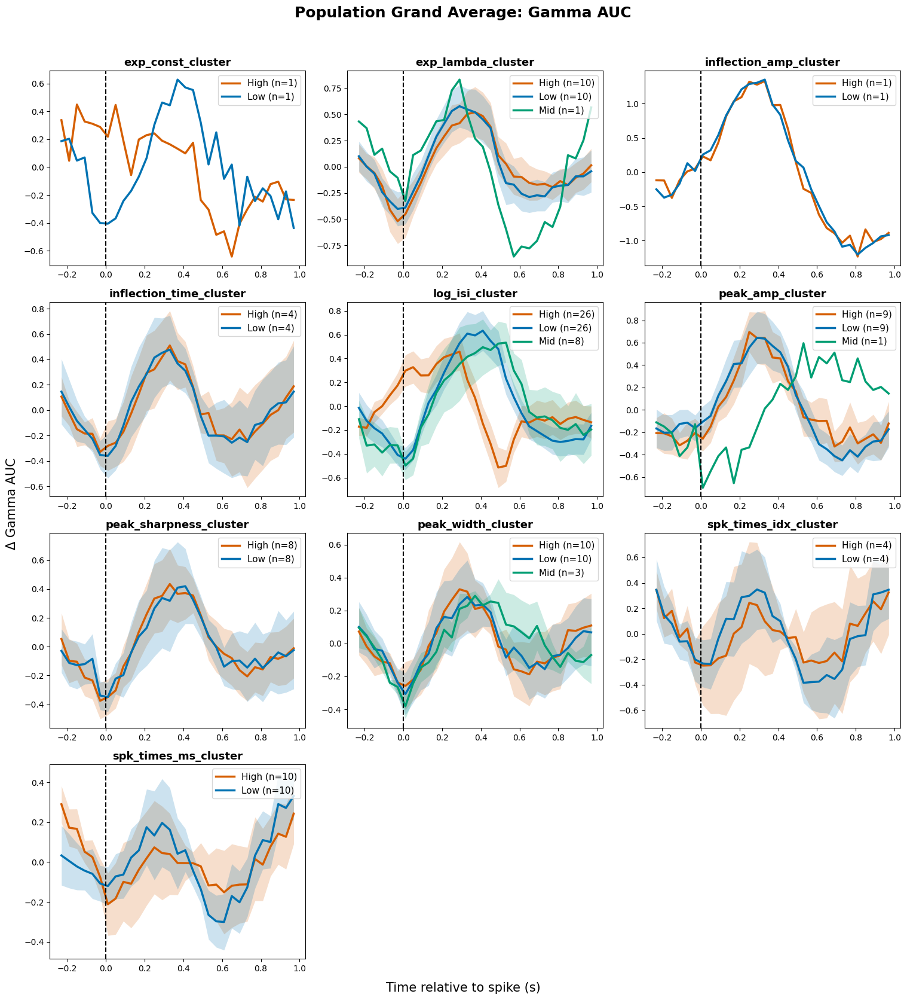

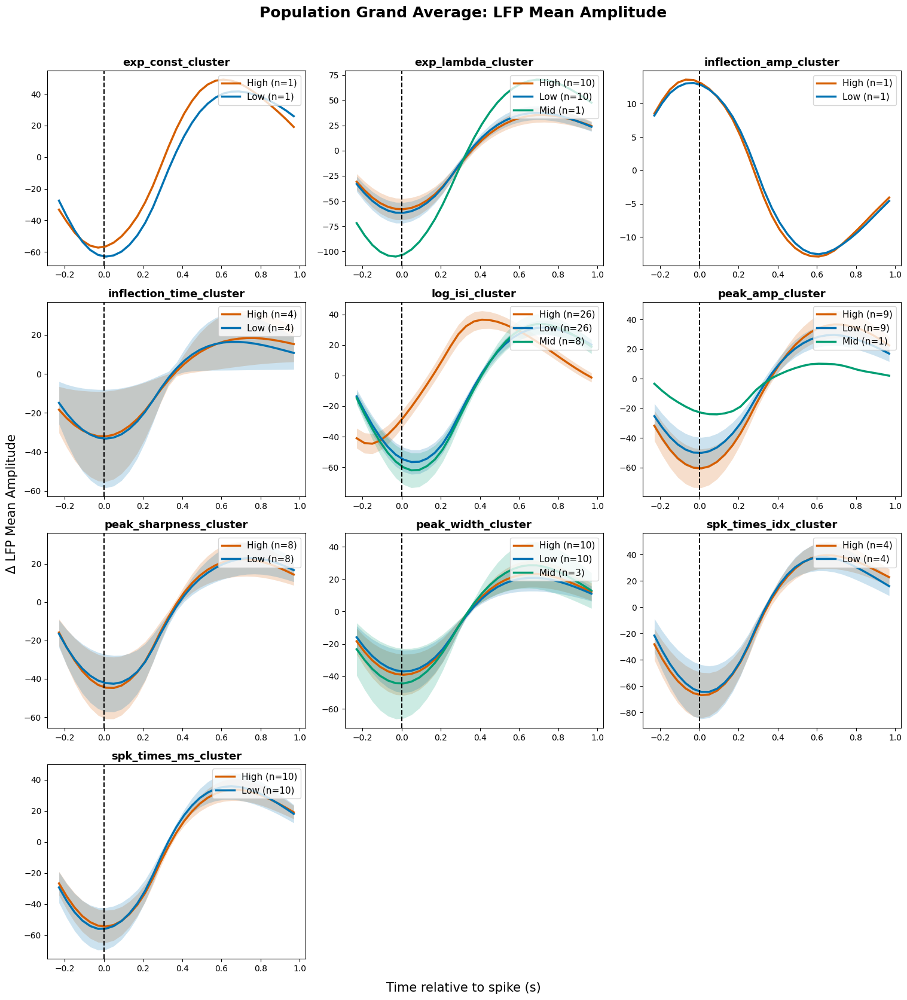

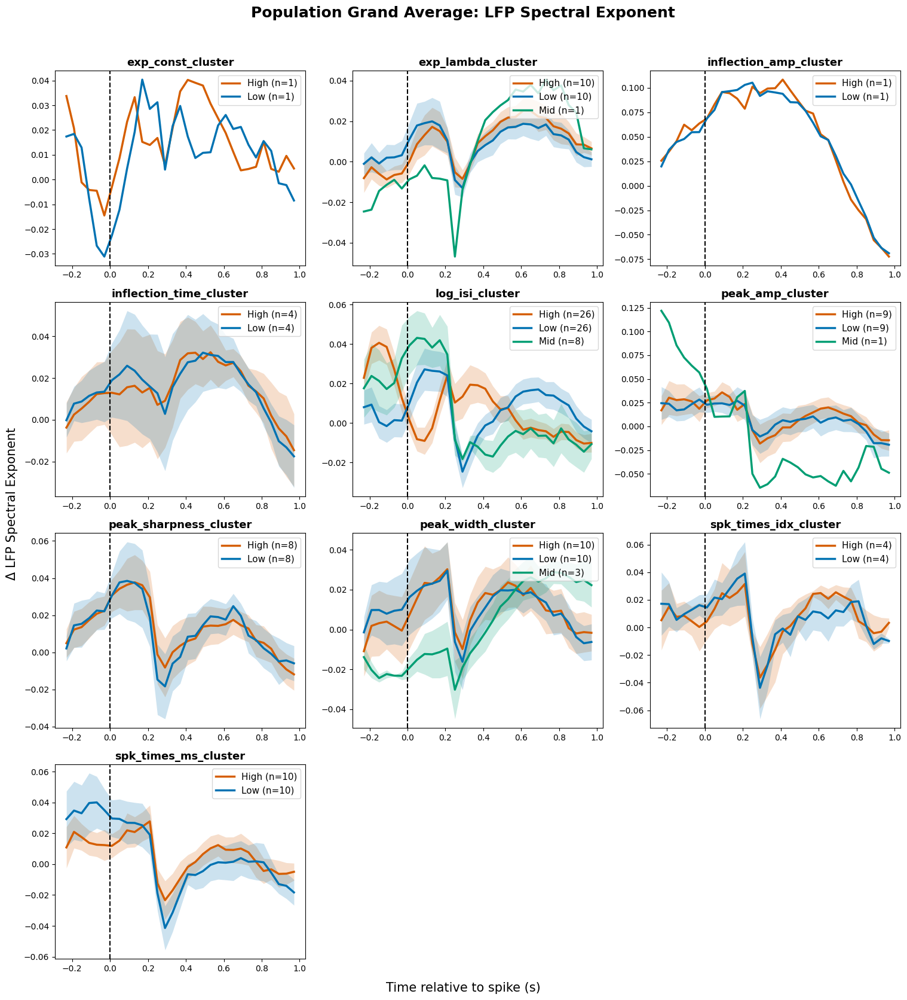

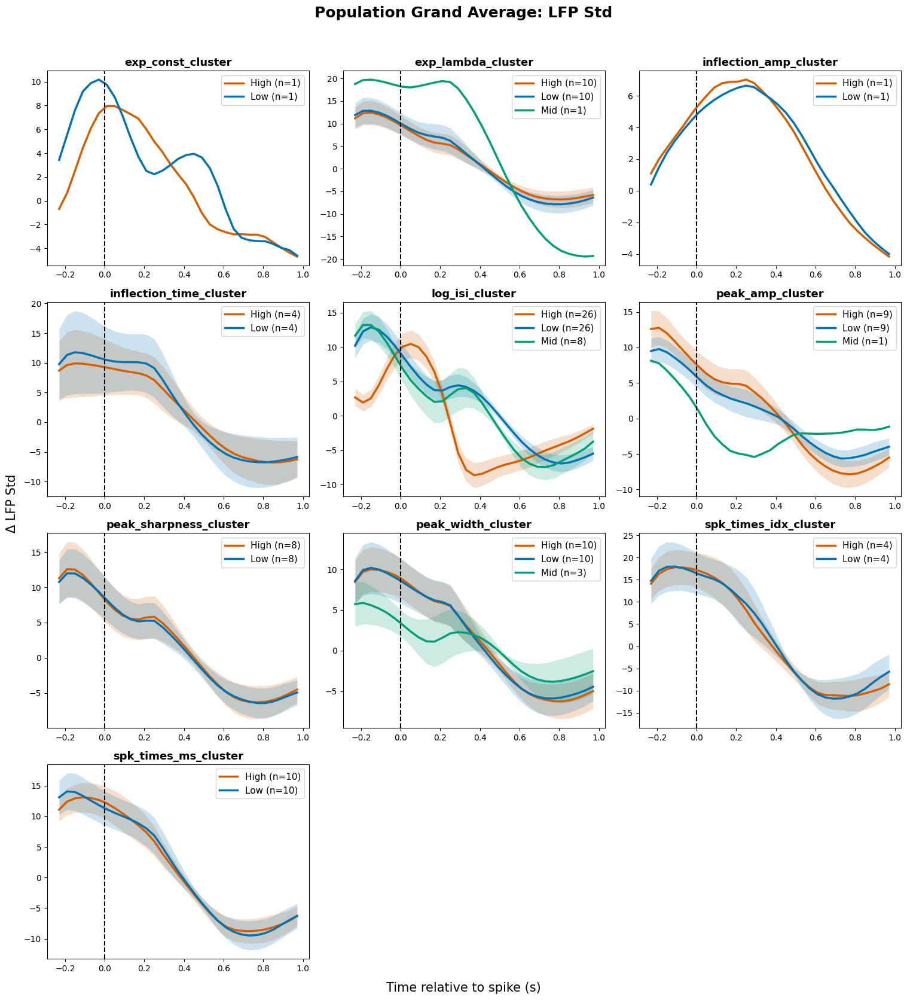

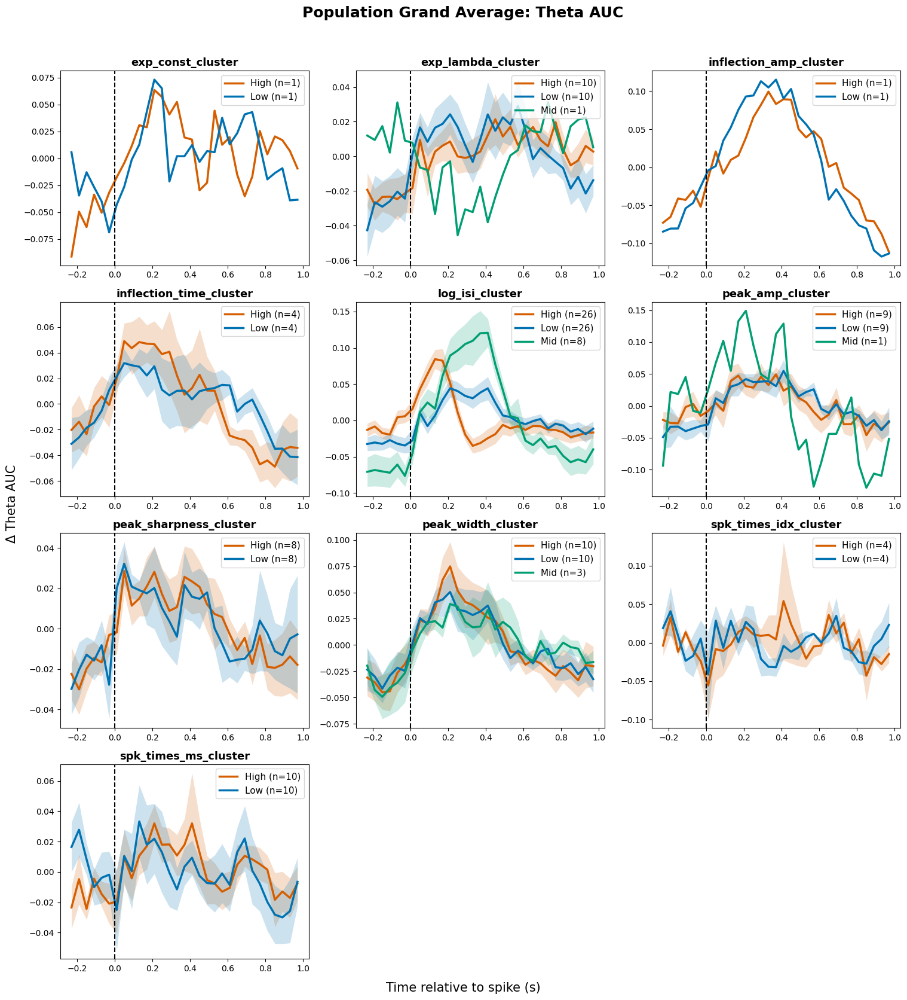

In [ ]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    plot_all_grand_average_traces(traces_sub, df_sub)

## 5. Significant Yield

What fraction of cells show a significant LFP effect for each feature pair?

In [ ]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    plot_significant_yield_heatmap(df_sub, traces_sub)

## 6. Bootstrap Validation

Are effects stable across the population?

In [ ]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    boot_results = bootstrap_population_stats(df_sub, master_traces=traces_sub)
    binom_results = binomial_yield_test(df_sub, master_traces=traces_sub)

## 7. Conclusions

Validated LFP × spike feature combinations.

In [ ]:
for label, cell_ids in SUBSET_LABELS:
    print(f"\n{'='*60}\n{label}\n{'='*60}")
    df_sub     = filter_df_stats(df_pop_stats, cell_ids)
    traces_sub = filter_traces(pop_traces, cell_ids)
    boot_results  = bootstrap_population_stats(df_sub, master_traces=traces_sub)
    binom_results = binomial_yield_test(df_sub, master_traces=traces_sub)
    perm_summary  = None  # run run_within_cell_permutation separately if needed
    df_conclusions = summarize_significant_combos(
        df_stats=df_sub, master_traces=traces_sub,
        boot_results=boot_results, perm_summary=perm_summary)
    plot_validated_directions(df_sub, traces_sub, df_conclusions=df_conclusions)